# Special Community FIFA World Cup - A PORTFOLIO PROJECT & Case Study

**Analyzing Data of FIFA Worldcup**

**Author: Akhand Shishodia**

![Open.jpeg](Open.jpeg)

**“The goal is to turn data into information, and information into insight.”— Carly Fiorina**

# Aim


**In this notebook we will explore the data and try to answer the following questions:**

**Do teams score more or less during games taking place at higher altitudes?**

**Are teams more evenly matched in later stages?**

**Do “Home” and “Away” designations affect team performance?**

# Import Libraries

Importing the required libraries to perform our analysis

We will install geopy, because it is not installed by default in colab, it is preferable to install them in the first cell, so other researchers can use the notebook without any problem.

we have used the following libraries in the notebook:-

| Library | Purpose |
|---------|---------|
|pandas|Data Manipulation|
|numpy | Numerical and Scientific computing |
|matplotlib | Data visualization |
|seaborn|Data visualization|
|plotly	|Data visualization|
|geopy| Geocoding web services|
|pycountry | ISO databases|
|requests | Send HTTP requests|
|json | Data interchange|
|IPython.display	|Data visualization|
|sklearn	|Data manipulation|
|scipy	|Data manipulation|
|tqdm	|For Progress Bars|
|folium	|Data visualization|
|base64	|Binary objects images|
|io | Manage the file related input and output operations|
|PIL | Data manipulation|

In [1]:
%%capture --no-stderr
# installing libs
!pip install geopy # geocoding web services
!pip install pycountry ## for ISO databases
!pip install -U kaleido ### helper library for plotly

In [2]:
import pandas as pd
import seaborn as sns
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
import requests 
import json
import matplotlib.pyplot as plt
import plotly
import os

# Importing Data

In [3]:
WorldCupMatches = pd.read_csv('WorldCupMatches.csv')
WorldCupPlayers = pd.read_csv('WorldCupPlayers.csv')
WorldCups = pd.read_csv('WorldCups.csv')

Reading the mentioned files in which data is stored aslo let's take a look at all the dataframes and see what we have and what we can do with it

it is always a good practice to take a look at the data before starting the analysis, so we can have a better understanding of the data

In [4]:
for i in [WorldCupMatches, WorldCupPlayers, WorldCups]:
    display(i.shape)
    display(i.isnull().sum())
    display(i.head())

(4572, 20)

Year                    3720
Datetime                3720
Stage                   3720
Stadium                 3720
City                    3720
Home Team Name          3720
Home Team Goals         3720
Away Team Goals         3720
Away Team Name          3720
Win conditions          3720
Attendance              3722
Half-time Home Goals    3720
Half-time Away Goals    3720
Referee                 3720
Assistant 1             3720
Assistant 2             3720
RoundID                 3720
MatchID                 3720
Home Team Initials      3720
Away Team Initials      3720
dtype: int64

,Year,Datetime,Stage,Stadium,City,Home Team Name,Home Team Goals,Away Team Goals,Away Team Name,Win conditions,Attendance,Half-time Home Goals,Half-time Away Goals,Referee,Assistant 1,Assistant 2,RoundID,MatchID,Home Team Initials,Away Team Initials
0,1930.0,13 Jul 1930 - 15:00,Group 1,Pocitos,Montevideo,France,4.0,1.0,Mexico,,4444.0,3.0,0.0,LOMBARDI Domingo (URU),CRISTOPHE Henry (BEL),REGO Gilberto (BRA),201.0,1096.0,FRA,MEX
1,1930.0,13 Jul 1930 - 15:00,Group 4,Parque Central,Montevideo,USA,3.0,0.0,Belgium,,18346.0,2.0,0.0,MACIAS Jose (ARG),MATEUCCI Francisco (URU),WARNKEN Alberto (CHI),201.0,1090.0,USA,BEL
2,1930.0,14 Jul 1930 - 12:45,Group 2,Parque Central,Montevideo,Yugoslavia,2.0,1.0,Brazil,,24059.0,2.0,0.0,TEJADA Anibal (URU),VALLARINO Ricardo (URU),BALWAY Thomas (FRA),201.0,1093.0,YUG,BRA
3,1930.0,14 Jul 1930 - 14:50,Group 3,Pocitos,Montevideo,Romania,3.0,1.0,Peru,,2549.0,1.0,0.0,WARNKEN Alberto (CHI),LANGENUS Jean (BEL),MATEUCCI Francisco (URU),201.0,1098.0,ROU,PER
4,1930.0,15 Jul 1930 - 16:00,Group 1,Parque Central,Montevideo,Argentina,1.0,0.0,France,,23409.0,0.0,0.0,REGO Gilberto (BRA),SAUCEDO Ulises (BOL),RADULESCU Constantin (ROU),201.0,1085.0,ARG,FRA


(37784, 9)

RoundID              0
MatchID              0
Team Initials        0
Coach Name           0
Line-up              0
Shirt Number         0
Player Name          0
Position         33641
Event            28715
dtype: int64

,RoundID,MatchID,Team Initials,Coach Name,Line-up,Shirt Number,Player Name,Position,Event
0,201,1096,FRA,CAUDRON Raoul (FRA),S,0,Alex THEPOT,GK,NaN
1,201,1096,MEX,LUQUE Juan (MEX),S,0,Oscar BONFIGLIO,GK,NaN
2,201,1096,FRA,CAUDRON Raoul (FRA),S,0,Marcel LANGILLER,NaN,G40'
3,201,1096,MEX,LUQUE Juan (MEX),S,0,Juan CARRENO,NaN,G70'
4,201,1096,FRA,CAUDRON Raoul (FRA),S,0,Ernest LIBERATI,NaN,NaN


(20, 10)

Year              0
Country           0
Winner            0
Runners-Up        0
Third             0
Fourth            0
GoalsScored       0
QualifiedTeams    0
MatchesPlayed     0
Attendance        0
dtype: int64

,Year,Country,Winner,Runners-Up,Third,Fourth,GoalsScored,QualifiedTeams,MatchesPlayed,Attendance
0,1930,Uruguay,Uruguay,Argentina,USA,Yugoslavia,70,13,18,590.549
1,1934,Italy,Italy,Czechoslovakia,Germany,Austria,70,16,17,363.000
2,1938,France,Italy,Hungary,Brazil,Sweden,84,15,18,375.700
3,1950,Brazil,Uruguay,Brazil,Sweden,Spain,88,13,22,1.045.246
4,1954,Switzerland,Germany FR,Hungary,Austria,Uruguay,140,16,26,768.607


# Merging Dataframes into one

We have merged the dataframes into one dataframe because it is easier to work with one dataframe rather than working with multiple dataframes, it is also easier to visualize the data in one dataframe.

We will merge the WorldCupMatches and WorldCups dataframes into one using the Year column as the key and we will use RoundID and MatchID as the keys to merge the WorldCupMatches and WorldCupPlayers dataframes into one dataframe

In [5]:
df = pd.merge(WorldCupMatches, WorldCups, on='Year')
df = pd.merge(df, WorldCupPlayers, on=['RoundID', 'MatchID'])

# Overview Of data

In [6]:
df.describe()

,Year,Home Team Goals,Away Team Goals,Attendance_x,Half-time Home Goals,Half-time Away Goals,RoundID,MatchID,GoalsScored,QualifiedTeams,MatchesPlayed,Shirt Number
count,39256.000000,39256.000000,39256.000000,39072.000000,39256.000000,39256.000000,3.925600e+04,3.925600e+04,39256.000000,39256.000000,39256.000000,39256.000000
mean,1986.790198,1.767653,1.026467,45992.823608,0.681297,0.432443,1.065148e+07,7.249288e+07,133.205930,24.569161,49.790503,10.773793
std,22.412554,1.579981,1.119818,23136.748496,0.920142,0.723583,2.725444e+07,1.190715e+08,30.563174,7.170799,15.263647,6.952372
min,1930.000000,0.000000,0.000000,2000.000000,0.000000,0.000000,2.010000e+02,2.500000e+01,70.000000,13.000000,17.000000,0.000000
25%,1970.000000,1.000000,0.000000,30600.000000,0.000000,0.000000,2.630000e+02,1.228000e+03,102.000000,16.000000,35.000000,5.000000
50%,1990.000000,1.000000,1.000000,43000.000000,0.000000,0.000000,4.180000e+02,2.352000e+03,141.000000,24.000000,52.000000,11.000000
75%,2006.000000,2.000000,1.000000,62387.000000,1.000000,1.000000,2.559310e+05,9.741003e+07,161.000000,32.000000,64.000000,17.000000
max,2014.000000,10.000000,7.000000,173850.000000,6.000000,5.000000,9.741060e+07,3.001865e+08,171.000000,32.000000,64.000000,23.000000


Using the describe method to have a quick glance at the overalls of the dataset. It helps us to understand the dataset without checking the whole dataset which is enormous.

# Checking for missing values

In [7]:
df.isna().sum()

Year                        0
Datetime                    0
Stage                       0
Stadium                     0
City                        0
Home Team Name              0
Home Team Goals             0
Away Team Goals             0
Away Team Name              0
Win conditions              0
Attendance_x              184
Half-time Home Goals        0
Half-time Away Goals        0
Referee                     0
Assistant 1                 0
Assistant 2                 0
RoundID                     0
MatchID                     0
Home Team Initials          0
Away Team Initials          0
Country                     0
Winner                      0
Runners-Up                  0
Third                       0
Fourth                      0
GoalsScored                 0
QualifiedTeams              0
MatchesPlayed               0
Attendance_y                0
Team Initials               0
Coach Name                  0
Line-up                     0
Shirt Number                0
Player Nam

Checking whether the dataframe contains any missing value which is a potential problem and can be a hurdle while performing our analysis.

# Handling missing Values

We can see that Attendance is containing some missing values, so we will fill the missing values with the mean of the Attendance column. We will use SimpleImputer From sklearn library and also we'll use the mean strategy to fill the missing values.

In [8]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
df['Attendance_x'] = imputer.fit_transform(df[['Attendance_x']]).ravel()

In [9]:
df.Attendance_x.isna().sum()

0

# Dropping unuseful Columns

We will drop the columns which are not useful for our analysis as we can see Event and Position Contain a lot of missing values, so we will drop them

In [10]:
df.drop(['Event', 'Position'], axis=1, inplace=True)

# Checking Data info

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39256 entries, 0 to 39255
Data columns (total 34 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Year                  39256 non-null  float64
 1   Datetime              39256 non-null  object 
 2   Stage                 39256 non-null  object 
 3   Stadium               39256 non-null  object 
 4   City                  39256 non-null  object 
 5   Home Team Name        39256 non-null  object 
 6   Home Team Goals       39256 non-null  float64
 7   Away Team Goals       39256 non-null  float64
 8   Away Team Name        39256 non-null  object 
 9   Win conditions        39256 non-null  object 
 10  Attendance_x          39256 non-null  float64
 11  Half-time Home Goals  39256 non-null  float64
 12  Half-time Away Goals  39256 non-null  float64
 13  Referee               39256 non-null  object 
 14  Assistant 1           39256 non-null  object 
 15  Assistant 2        

As we can see there are some Columns Which d.types are object, so we will convert them into int or float according to the data

# Changing Columns Dtypes

In [12]:
df['Year'] = df['Year'].astype(int)
df['Home Team Goals'] =  df['Home Team Goals'].astype(int)
df['Away Team Goals'] =  df['Away Team Goals'].astype(int)
df['Attendance_x'] = df['Attendance_x'].astype(int)
df['RoundID'] = df['RoundID'].astype(int)
df['MatchID'] = df['MatchID'].astype(int)
df['GoalsScored'] = df['GoalsScored'].astype(int)
df['QualifiedTeams'] = df['QualifiedTeams'].astype(int)
df['MatchesPlayed'] = df['MatchesPlayed'].astype(int)
df['Shirt Number'] = df['Shirt Number'].astype(int)

Hurray! We have Changed the data types of the columns, now we can perform our analysis

In [13]:
df.columns

Index(['Year', 'Datetime', 'Stage', 'Stadium', 'City', 'Home Team Name',
       'Home Team Goals', 'Away Team Goals', 'Away Team Name',
       'Win conditions', 'Attendance_x', 'Half-time Home Goals',
       'Half-time Away Goals', 'Referee', 'Assistant 1', 'Assistant 2',
       'RoundID', 'MatchID', 'Home Team Initials', 'Away Team Initials',
       'Country', 'Winner', 'Runners-Up', 'Third', 'Fourth', 'GoalsScored',
       'QualifiedTeams', 'MatchesPlayed', 'Attendance_y', 'Team Initials',
       'Coach Name', 'Line-up', 'Shirt Number', 'Player Name'],
      dtype='object')

# Exploratory Data Analsyis 

"The quicker you realize the problem with your data, the better you can deliver a valid conclusion to drive the business."

As we can notice from data Columns there is no column for Altitude, In order to answer our First Question we need a column Which will Contain Altitude of City/Stadium.

So, we will Find Latitude and Longitude of each city and then we will find the altitude of each stadium using the latitude and longitude.

We will define our 2 functions to get the latitude and longitude of each city and then we will use the latitude and longitude to get the altitude of each stadium.

We will use the geopy library to get the latitude and longitude of each city.

We have installed the geopy library in the first cell of the notebook.

# One variable graph

In [15]:
x1 = df['GoalsScored']
hist_data = [x1]
group_labels = ['GoalsScored']

fig = ff.create_distplot(hist_data, group_labels).update_layout(
    xaxis_title="GoalsScored",
    
    title="GoalsScored",
)
fig.show()
fig.write_html("GoalsScored.html")


GoalsScored Column Looks intresting.

Let's View Box plot and findout Mean,Max and Min values of Goalsscored Column

In [16]:
fig = px.box(df, y="GoalsScored")
fig.show()

Nice It's Look like There are max 171 Goals

# Two variables graph

In [17]:
t = df.groupby(['Year'])['GoalsScored'].sum().reset_index()
fig = px.bar(t, x="GoalsScored", y="Year", color="GoalsScored", orientation='h', height=400,hover_data=['GoalsScored'])
fig.update_layout(
    xaxis_title="GoalsScored",
    yaxis_title="Year",
    title="Goals Scored vs Year",
)
fig.show()
fig.write_html("GoalsScored.html")

Awesome, we can say that 2014 is Greatest Year Of football history Since there are many Goals recorded

Let's see what else we can find out from data

Defining Functions that uses open-elevation api and Nominatim to get altitude of given Stadium/city
Here is Intresting part:

Now we will define 2 Functions

One will Help us to find City Latitude and Longitude

and another fuction will help us to find elevation from cordinates

In [75]:
from geopy.geocoders import Nominatim

def get_stadium_location(stadium):
    #### Function author:- Vivek Patel ####
    geolocator = Nominatim(user_agent="user_agent")
    location = geolocator.geocode(stadium,timeout = 10)
    if location is None:
        return (0, 0)
    else:
      return (location.latitude, location.longitude)

def get_altitude(lat, lon,city):
    #### Function author:- Vivek Patel ####
    # https://api.open-elevation.com/api/v1/lookup?locations={1},{2}
    url = "https://api.open-elevation.com/api/v1/lookup?locations={},{}".format(lat, lon)
    response = requests.get(url)
    data = json.loads(response.text)
    return data['results'][0]['elevation']

Importing Modules for Progress bar

In [19]:
from functools import partial
from tqdm import tqdm
from IPython.display import clear_output

tqdm = partial(tqdm, position=0, leave=True)

Calling our functions to get Latitude, Longitude, and Altitude of given city.
as overview first we will get the latitude and longitude of each city and then we will use the latitude and longitude to get the altitude of each stadium.

and use the tqdm library to show the progress bar, so we can see the progress of our code.

We will use the clear_output() function to clear the output of the progress bar, so we can see the progress bar in a better way, time.sleep() function make the progress bar more visible.

In [21]:
unique_cities = df['City'].unique()
city_altitude = {}
city_longitude = {}
city_latitude = {}
for city in tqdm(unique_cities):
        clear_output(wait=True)
        lat, lon = get_stadium_location(city)
        city_latitude[city] = lat
        city_longitude[city] = lon
        city_altitude[city] = get_altitude(lat, lon,city)
        # os.system('clear')
        # print('\nCity name:{} \n Latitude:{} \n Longitude:{} \n Altitude:{} \n'.format(city, lat, lon, city_altitude[city]))


100%|█████████████████████████████████████████| 151/151 [09:13<00:00,  3.66s/it]


Nice We Got all elevation values for our Analysis

# Adding Latitude, Longitude, and Altitude to DataFrame. Now ,we will add the latitude, longitude, and altitude to the dataframe

In [23]:
df['City Altitude'] = df['City'].map(city_altitude)
df['City Longitude'] = df['City'].map(city_longitude)
df['City Latitude'] = df['City'].map(city_latitude)
df = df[df['City Altitude'] != 0]

Let's Verify values and see what we got

In [24]:
df['City Altitude'],df['City Longitude'],df['City Latitude'] 

(0         42.0
 1         42.0
 2         42.0
 3         42.0
 4         42.0
          ...  
 39251    651.0
 39252    651.0
 39253    651.0
 39254    651.0
 39255    651.0
 Name: City Altitude, Length: 38508, dtype: float64,
 0       -56.191310
 1       -56.191310
 2       -56.191310
 3       -56.191310
 4       -56.191310
            ...    
 39251   -88.914068
 39252   -88.914068
 39253   -88.914068
 39254   -88.914068
 39255   -88.914068
 Name: City Longitude, Length: 38508, dtype: float64,
 0       -34.905892
 1       -34.905892
 2       -34.905892
 3       -34.905892
 4       -34.905892
            ...    
 39251    13.800038
 39252    13.800038
 39253    13.800038
 39254    13.800038
 39255    13.800038
 Name: City Latitude, Length: 38508, dtype: float64)

In [25]:
# saving Progress for handy to use
# df.to_csv('data.csv', index=False)


Let's View First Row So we can Plan Our Analysis

In [26]:
pd.set_option('display.max_columns', None)
df.head(1)

,Year,Datetime,Stage,Stadium,City,Home Team Name,Home Team Goals,Away Team Goals,Away Team Name,Win conditions,Attendance_x,Half-time Home Goals,Half-time Away Goals,Referee,Assistant 1,Assistant 2,RoundID,MatchID,Home Team Initials,Away Team Initials,Country,Winner,Runners-Up,Third,Fourth,GoalsScored,QualifiedTeams,MatchesPlayed,Attendance_y,Team Initials,Coach Name,Line-up,Shirt Number,Player Name,City Altitude,City Longitude,City Latitude
0,1930,13 Jul 1930 - 15:00,Group 1,Pocitos,Montevideo,France,4,1,Mexico,,4444,3.0,0.0,LOMBARDI Domingo (URU),CRISTOPHE Henry (BEL),REGO Gilberto (BRA),201,1096,FRA,MEX,Uruguay,Uruguay,Argentina,USA,Yugoslavia,70,13,18,590.549,FRA,CAUDRON Raoul (FRA),S,0,Alex THEPOT,42.0,-56.19131,-34.905892


# All Stadiums Altitude Wise

In [29]:
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster
from folium.plugins import HeatMap
from folium.plugins import HeatMapWithTime

import branca.colormap as cm
import io
from PIL import Image

In [30]:
Tempdf = df[['City Latitude','City Longitude','City Altitude','Stadium','GoalsScored','Country','City']]
Tempdf = Tempdf.drop_duplicates(subset=['City Latitude','City Longitude','City Altitude','Stadium','Country','City'], keep='first')

In [77]:
Tempdf = Tempdf[Tempdf['City Altitude'] != 0]
m=folium.Map(location=[Tempdf['City Latitude'].mean(), Tempdf['City Longitude'].mean()], tiles='cartodbpositron', zoom_start=2)
marker_cluster = MarkerCluster().add_to(m)
for i in range(0,len(Tempdf)):
    folium.Marker([Tempdf.iloc[i]['City Latitude'], Tempdf.iloc[i]['City Longitude']], popup=Tempdf.iloc[i]['Stadium']+' '+Tempdf.iloc[i]['City']+' '+Tempdf.iloc[i]['Country']+' '+str(Tempdf.iloc[i]['City Altitude'])+'m').add_to(marker_cluster)
t = 'All Stadiums Altitude Wise'
# create colormap
colormap = cm.LinearColormap(
    colors=['#00FF00', '#FFFF00', '#FFA500', '#FF0000'],
    index=[Tempdf['City Altitude'].min(),Tempdf['City Altitude'].min()+1000,Tempdf['City Altitude'].min()+2000,Tempdf['City Altitude'].max()],
    vmin=Tempdf['City Altitude'].min(),
    vmax=Tempdf['City Altitude'].max()
)
colormap.caption = 'Altitude'
colormap.add_to(m)
display(m)


In [73]:
import plotly.express as px
import plotly.io as pio
import time; 
fig = px.scatter_geo(df, lat="City Latitude", lon="City Longitude", color="City Altitude",hover_name="Stadium", size_max=0, color_discrete_sequence=px.colors.qualitative.Dark24, opacity=0.8).update_layout(
    title_text = 'All Stadiums Altitude Wise',
    showlegend = True)
fig.write_image("All Stadiums Altitude Wise1.png")
fig.write_html("All Stadiums Altitude Wise1.html")
fig.show()

Wow,

majority there are dark blue colors it means Majority of our Stadiums are on low Ground.

There are some Yellow and Pink colors as well it means thier stadiums are on very high place.

# Questions

**Do teams score more or less during games taking place at higher altitudes?**

We will start answering the first question by creating one dataframe which contains data where altitude is greater than 1000m.

In [41]:
high_altitude_cities = df[df['City Altitude'] > 1000]
# high_altitude_cities

In [42]:
high_altitude_cities['City Altitude'].corr(high_altitude_cities['GoalsScored'])

-0.5454812124253606

In [ ]:
fig = px.scatter(high_altitude_cities, x="City Altitude", y="GoalsScored", trendline="ols", title="Goals scored vs City Altitude", color_discrete_sequence=px.colors.qualitative.Dark24, opacity=0.8, size_max=10, height=600, width=800, template='plotly_dark', trendline_color_override='red')
fig.show()

-0.55 strong evidance, Great

Correlation is -0.5454812124253594 it means that there is a negative correlation between goals scored and city altitude

If it's 0 means no corelation

If pearson corr. coff is 1 it means there is positive correlation

But in our case it's -0.54 it means if altitude increase Scores are more likely to decrese

We may give it scientific reasons:

We all are humans, everyone has limitations and humanbody too on higher altitude players might struggle to run and focus on game, becase of thin air and lack of oxygen.

Let's do some Data Viz.

In [44]:
%%capture --no-stderr

!pip install pip==21.3.1
!pip install pycountry_convert
!git clone https://github.com/matahombres/CSS-Country-Flags-Rounded.git

In [48]:
import pycountry
fig = px.scatter(
    Tempdf,
    x="GoalsScored",
    y="City Altitude",
    hover_name="Stadium",
    hover_data=["City Altitude", "GoalsScored", "Country",'Stadium'],
)
fig.update_traces(marker_color="rgba(0,0,0,0)")

# get max value of x and y axis
minDim = Tempdf[["City Altitude", "GoalsScored"]].max().idxmax()
maxi = Tempdf[minDim].max()
from pycountry_convert import country_alpha2_to_continent_code, country_name_to_country_alpha2
def get_iso2_code(country_name):
    country = pycountry.countries.get(name=country_name)
    if country is None:
        return None
    return country.alpha_2
Tempdf['iso_alpha'] = Tempdf['Country'].apply(get_iso2_code)

# for each row in temp df
for i, row in Tempdf.iterrows():
    # get country iso code
    country_iso = row["iso_alpha"]
    # add image to the graph
    fig.add_layout_image(
        dict(
            source=f"https://viveks-codes.github.io/CSS-Country-Flags-Rounded/flags/{country_iso}.png",
            xref="x",
            yref="y",
            xanchor="center",
            yanchor="middle",
            x=row["GoalsScored"],
            y=row["City Altitude"],
            sizex= int(row["City Altitude"] / Tempdf["City Altitude"].max()) * maxi * 0.15 + maxi * 0.08,
            sizey= int(row["City Altitude"] / Tempdf["City Altitude"].max()) * maxi * 0.15+ maxi * 0.08,
            sizing="contain",
            opacity=0.8,
            layer="above"
        )
    )
# update layout
fig.update_layout(height=600, width=1000)

# show graph
fig.show()

Nice. It's Look like Brazil and Germany are great teams!

In [49]:
%%capture --no-stderr

pip install pycountry_convert

**Are teams more evenly matched in later stages?**

In [50]:
 df['Stage'].value_counts()

Round of 16                 3985
Quarter-finals              3211
Group A                     2688
Group B                     2556
Group 2                     2470
Group 1                     2413
Group 4                     2384
Group 3                     2261
Group C                     2160
Group D                     2160
Group F                     2160
Group E                     2160
Semi-finals                 1774
Group G                     1368
Group H                     1367
Final                        979
Match for third place        662
Group 6                      516
First round                  373
Preliminary round            321
Group 5                      264
Play-off for third place     184
Third place                   92
Name: Stage, dtype: int64

In [51]:
def encode_stage(stage):
    if stage in ['Group A', 'Group B', 'Group C', 'Group D', 'Group E', 'Group F', 'Group G', 'Group H','Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6']:
        return 'First Phase'
    else:
        return 'Last Phase'

df['Stage'] = df['Stage'].apply(encode_stage)
df['Stage'].unique()

array(['First Phase', 'Last Phase'], dtype=object)

In [52]:
df['Goal Difference'] = df['Home Team Goals'] - df['Away Team Goals']
df.groupby('Stage')['Goal Difference'].mean()

Stage
First Phase    0.756341
Last Phase     0.674035
Name: Goal Difference, dtype: float64

In [53]:
from scipy.stats import ttest_ind
ttest_ind(df[df['Stage'] == 'First Phase']['Home Team Goals'], df[df['Stage'] == 'Last Phase']['Home Team Goals'])

Ttest_indResult(statistic=-6.474957692766826, pvalue=9.59778917008238e-11)

It means that there is a significant difference between the average goals scored by home team in first phase and last phase, because pvalue is less than 0.05

In [55]:
print('The average goals scored by home team in first phase is',df[df['Stage'] == 'First Phase']['Home Team Goals'].mean())
print('The average goals scored by home team in last phase is',df[df['Stage'] == 'Last Phase']['Home Team Goals'].mean())

The average goals scored by home team in first phase is 1.7234745794184276
The average goals scored by home team in last phase is 1.8363699162421208


In [56]:
table = pd.pivot_table(df, values=['Home Team Goals', 'Away Team Goals'], index=['Stage'], aggfunc=np.mean)
table

,Away Team Goals,Home Team Goals
Stage,,
First Phase,0.967133,1.723475
Last Phase,1.162335,1.836370


Let's define some helper functions


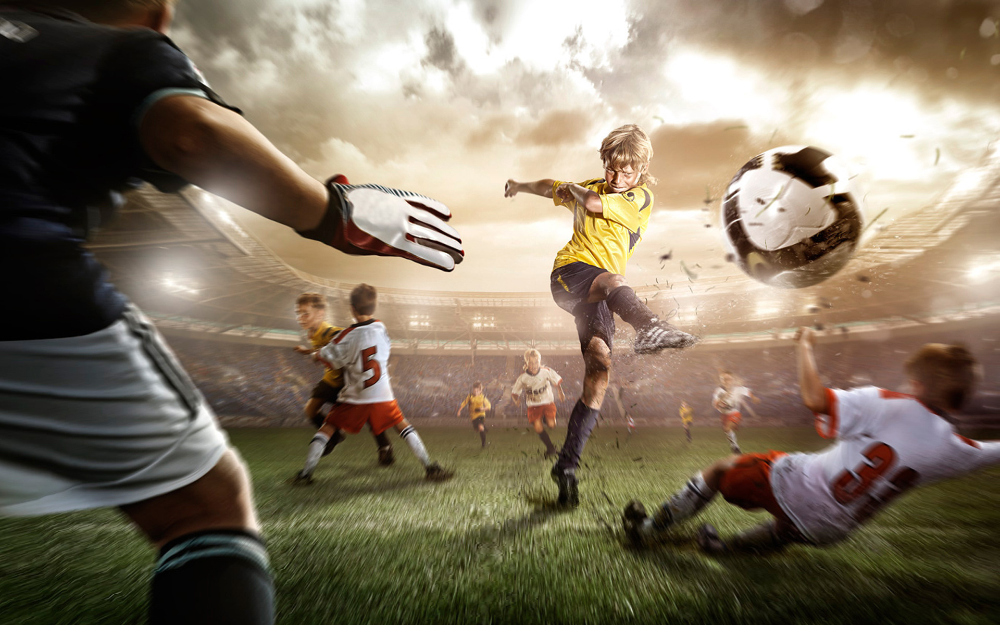

In [57]:
import base64
from io import BytesIO
import requests
from PIL import Image

# get image
img = Image.open(requests.get("https://images.pling.com/img/00/00/49/41/10/1226772/72ccdfc9877a41431c0021c72d05ab610288.jpg", stream=True).raw)

fig = go.Figure(data=[go.Table(
                    # show stage Home team goal away team goal
                    header=dict(values=['Stage', 'Home Team Goals', 'Away Team Goals'],
                                fill_color='paleturquoise',
                                align='left'),
                    cells=dict(values=[table.index, table['Home Team Goals'], table['Away Team Goals']],
                                 fill_color='lavender',
                                    align='center'))
                        ])

fig.add_layout_image(
    dict(
        source=img,
        xref="paper", yref="paper",
        x=0.5, y=0.5,
        sizex=1, sizey=1,
        sizing="stretch",
        opacity=0.3,
        xanchor="center", yanchor="middle"
    )
)


fig.update_layout(title_text="Are teams more evenly matched in later stages?",font=dict(family="Arial", size=15, color="RebeccaPurple"
  
))
fig.show()


Nice, We Got Our answer, it means away teams keeps try to balance it self to mean to 1, on the unlike away Home teams try hard to get more goals in final

**Do “Home” and “Away” designations affect team performance?**

In [59]:
df['Home Team Win'] = df['Home Team Goals'] > df['Away Team Goals']
df['Away Team Win'] = df['Home Team Goals'] < df['Away Team Goals']
df['Draw'] = df['Home Team Goals'] == df['Away Team Goals']
print('The probability of home team winning is',df['Home Team Win'].mean())
print('The probability of away team winning is',df['Away Team Win'].mean())
print('The probability of draw is',df['Draw'].mean())
df['Home Team Win'].mean(),df['Away Team Win'].mean(),df['Draw'].mean()

The probability of home team winning is 0.5678560299158616
The probability of away team winning is 0.20832034901838578
The probability of draw is 0.22382362106575257


(0.5678560299158616, 0.20832034901838578, 0.22382362106575257)

In [60]:
from scipy.stats import ttest_ind

ttest_ind(a=df['Home Team Goals'],b= df['Away Team Goals'],equal_var=True)

Ttest_indResult(statistic=74.42236525710493, pvalue=0.0)

It means if away team plays in home then probablity of winning is more than home team

Simple answer is Yes, it means that there is a significant difference between the average goals scored by home and away teams,

home teams score more goals than away teams, It's obviuous because home team knows stadium more, however they are well trained on motherground.

**References:**

Plotly thread- https://community.plotly.com/t/put-images-inside-bubbles/41364/2 (2020)

folium- https://python-visualization.github.io/folium/quickstart.html

open-elevation API- https://open-elevation.com/

geopy- (https://geopy.readthedocs.io/en/stable/)

and Thanks to @abecklas for Dataset which is available at kaggle.

**“Torture the data, and it will confess to anything.” – Ronald Coase**


# Thanks For Reading 